In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/raw-video/conveyor-belt-candy.webm
/kaggle/input/valid-image/video2-00053.png
/kaggle/input/valid-image/video2-00050.png
/kaggle/input/valid-image/video2-00047.png
/kaggle/input/valid-image/video2-00048.png
/kaggle/input/valid-image/video2-00049.png
/kaggle/input/valid-image/video2-00057.png
/kaggle/input/valid-image/video2-00054.png
/kaggle/input/valid-image/video2-00051.png
/kaggle/input/valid-image/video2-00055.png
/kaggle/input/valid-image/video2-00056.png
/kaggle/input/valid-image/video2-00052.png
/kaggle/input/all-images/video2-00027.png
/kaggle/input/all-images/video2-00012.png
/kaggle/input/all-images/video2-00022.png
/kaggle/input/all-images/video2-00014.png
/kaggle/input/all-images/video2-00018.png
/kaggle/input/all-images/video2-00025.png
/kaggle/input/all-images/video2-00046.png
/kaggle/input/all-images/video2-00001.png
/kaggle/input/all-images/video2-00041.png
/kaggle/input/all-images/video2-00013.png
/kaggle/input/all-images/video2-00019.png
/kaggle/input/al

In [2]:
!python --version

Python 3.10.13


In [3]:
!nvidia-smi

Tue May 28 12:36:17 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.129.03             Driver Version: 535.129.03   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla P100-PCIE-16GB           Off | 00000000:00:04.0 Off |                    0 |
| N/A   34C    P0              26W / 250W |      0MiB / 16384MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [1]:
pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.2/41.2 kB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 779.6/779.6 kB 12.4 MB/s eta 0:00:00a 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [2]:
from ultralytics import YOLO
model=YOLO('yolov8s.pt')

100%|██████████| 21.5M/21.5M [00:00<00:00, 156MB/s]


In [3]:
import os
home=os.getcwd()
home

'/kaggle/working'

In [4]:
!pip install \
autodistill \
 autodistill-grounded-sam \
autodistill-yolov8 \
 supervision

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 527.0/527.0 kB 8.9 MB/s eta 0:00:00ta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 111.0/111.0 kB 7.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 93.1/93.1 kB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 426.2/426.2 kB 19.4 MB/s eta 0:00:00
  Attempting uninstall: ultralytics
    Found existing installation: ultralytics 8.2.28
    Uninstalling ultralytics-8.2.28:
      Successfully uninstalled ultralytics-8.2.28


### specify the image and video directry path

In [5]:
video_directory_path= f"{home}/videos"

image_directory_path = "/kaggle/input/trafic"

In [6]:
image_directory_path

'/kaggle/input/trafic'

In [7]:
import supervision as sv
image_paths=sv.list_files_with_extensions(directory=image_directory_path,
                                         extensions=['png','jpg'])
len(image_paths)

60

### render the pictures from gallery

In [8]:
sample_size=16
sample_grid=(4,4)
sample_plot=(16,16)

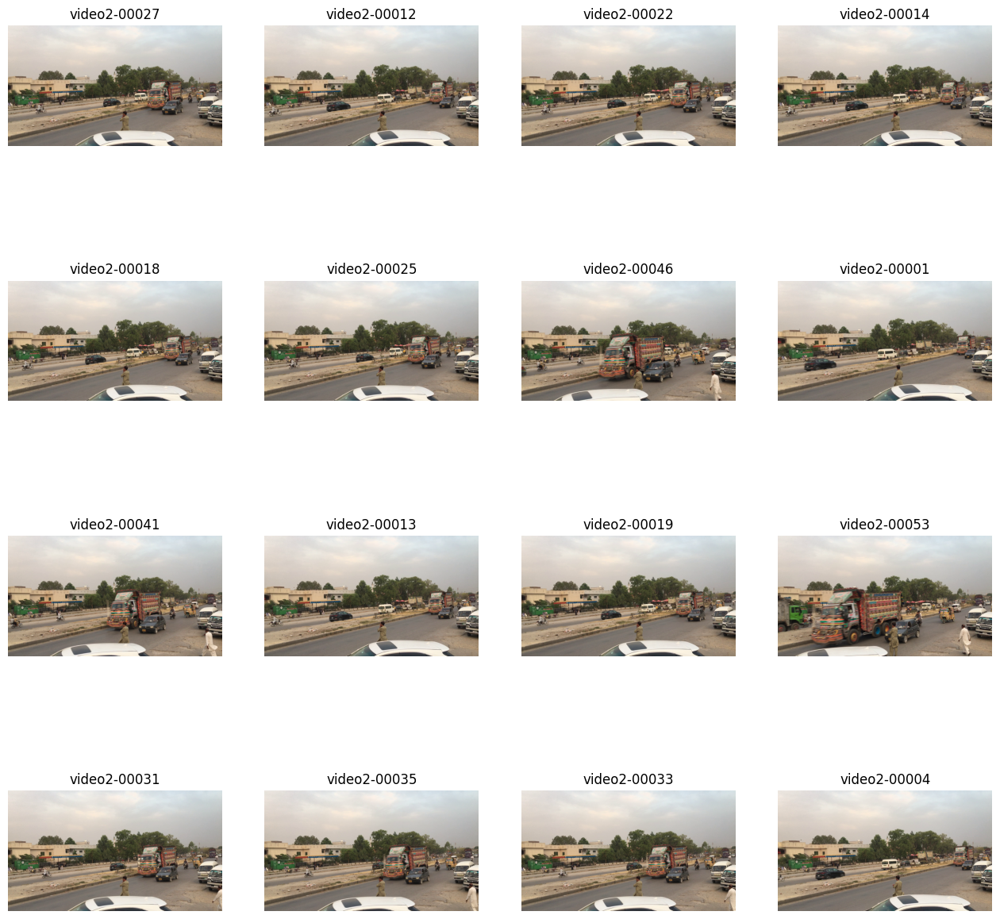

In [9]:
import cv2
title=[image_path.stem
      for image_path
      in image_paths[:sample_size]]
images=[cv2.imread(str(image_path))
       for image_path
       in image_paths[:sample_size]]

sv.plot_images_grid(images=images,titles=title,grid_size=sample_grid,size=sample_plot)

### Grounding dino for annotate the images

In [10]:
pip install autodistill-grounding-dino

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.4/82.4 kB 1.9 MB/s eta 0:00:0000:01
  Preparing metadata (setup.py) ... done
  Created wheel for rf-groundingdino: filename=rf_groundingdino-0.1.2-py2.py3-none-any.whl size=88731 sha256=3ef38f9c9c725df863edb16721fac22c90e2c6ae4c1de12154b59d74b4eb69f5
  Stored in directory: /root/.cache/pip/wheels/d6/3f/f8/137b4305e941ad2e0b66cba52e914dda7560308eb91e7e5e47
Successfully built rf-groundingdino
  Attempting uninstall: rf-groundingdino
    Found existing installation: rf-groundingdino 0.2.0
    Uninstalling rf-groundingdino-0.2.0:
      Successfully uninstalled rf-groundingdino-0.2.0
Note: you may need to restart the kernel to use updated packages.


In [11]:
pip install roboflow

Reason for being yanked: deprecated, use 4.8.0.76
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.5/75.5 kB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 11.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 33.6 MB/s eta 0:00:00:00:0100:01
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.9.0.80
    Uninstalling opencv-python-headless-4.9.0.80:
      Successfully uninstalled opencv-python-headless-4.9.0.80
  Attempting uninstall: idna
    Found existing installation: idna 3.6
    Uninstalling idna-3.6:
      Successfully uninstalled idna-3.6
  Attempting uninstall: cycler
    Found existing installation: cycler 0.12.1
    Uninstalling cycler-0.12.1:
      Successfully uninstalled cycler-0.12.1
  Attempting uninstall: c

In [12]:
dataset_directory_path=f"{home}/dataset"
dataset_directory_path

'/kaggle/working/dataset'

In [13]:
from autodistill.detection import CaptionOntology
ontology=CaptionOntology({
    "car": 'car',
    'moter bike' : 'moter bike',
    'man' : 'man',
    'rick shaw' : 'rick shaw',
    'truck' : 'truck',
    'van' : 'van',
    'tree' : 'tree'
})


In [14]:
from autodistill_grounding_dino import GroundingDINO
base_model=GroundingDINO(ontology=ontology)
dataset=base_model.label(input_folder=image_directory_path,
                        extension='png',
                        output_folder=dataset_directory_path)

trying to load grounding dino directly
downloading dino model weights


torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /usr/local/src/pytorch/aten/src/ATen/native/TensorShape.cpp:3526.)


final text_encoder_type: bert-base-uncased


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

Labeling /kaggle/input/trafic/video2-00027.png:   0%|          | 0/60 [00:00<?, ?it/s]The `device` argument is deprecated and will be removed in v5 of Transformers.
torch.utils.checkpoint: please pass in use_reentrant=True or use_reentrant=False explicitly. The default value of use_reentrant will be updated to be False in the future. To maintain current behavior, pass use_reentrant=True. It is recommended that you use use_reentrant=False. Refer to docs for more details on the differences between the two variants.
None of the inputs have requires_grad=True. Gradients will be None
The `device` argument is deprecated and will be removed in v5 of Transformers.
torch.utils.checkpoint: please pass in use_reentrant=True or use_reentrant=False explicitly. The default value of use_reentrant will be updated to be False in the future. To maintain current behavior, pass use_reentrant=True. It is recommended that you use use_reentrant=False. Refer to docs for more details on the differences between

Labeled dataset created - ready for distillation.


### making yaml file and save it into directory

In [15]:
import yaml

config = {
    'names': ["car", "moter bike", "man", "rickshaw", "truck", "van", "tree"],
    'train': '/kaggle/working/dataset/train/images',
    'val': '/kaggle/working/dataset/valid/images',
    'nc': 7
}

with open("data.yaml", "w") as file:
    yaml.dump(config, file, default_flow_style=False)


In [16]:
annotation_directory_path="/kaggle/working/dataset/train/labels"
image_directory_path="/kaggle/working/dataset/train/images"
data_yamal_path=f"{home}/data.yaml"

In [17]:
dataset=sv.DetectionDataset.from_yolo(annotations_directory_path=annotation_directory_path,
                                     images_directory_path=image_directory_path,
                                     data_yaml_path=data_yamal_path)

In [18]:
len(dataset)

48

### render the annotated images

In [19]:
sample_size=50
sample_grid=(10,5)
sample_plot=(64,32)

In [20]:
image_names=list(dataset.images.keys())[:sample_size]
mask_annotator=sv.LabelAnnotator()
box_annotator=sv.BoundingBoxAnnotator()


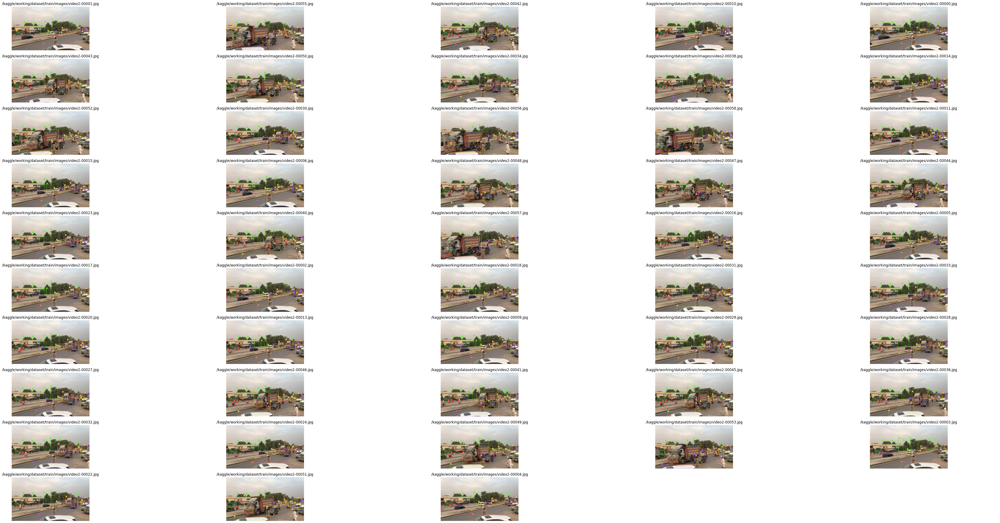

In [21]:
images = []
for image_name in image_names:
    image = dataset.images[image_name]
    annotations = dataset.annotations[image_name]
    labels = [
        dataset.classes[class_id]
        for class_id
        in annotations.class_id]
    annotates_image = mask_annotator.annotate(
        scene=image.copy(), 
        detections=annotations)
    annotates_image = box_annotator.annotate(
        scene=annotates_image, 
        detections=annotations, 
        )
    images.append(annotates_image)

sv.plot_images_grid(
    images=images, 
    titles=image_names, 
    grid_size=sample_grid, 
    size=sample_plot)

In [22]:
pip install -U ultralytics


  Using cached ultralytics-8.2.28-py3-none-any.whl.metadata (41 kB)
Using cached ultralytics-8.2.28-py3-none-any.whl (779 kB)
  Attempting uninstall: ultralytics
    Found existing installation: ultralytics 8.0.81
    Uninstalling ultralytics-8.0.81:
      Successfully uninstalled ultralytics-8.0.81
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
autodistill-yolov8 0.1.4 requires ultralytics==8.0.81, but you have ultralytics 8.2.28 which is incompatible.
Note: you may need to restart the kernel to use updated packages.


In [23]:
!python -c "import ultralytics; print(ultralytics.__version__)"


8.2.28


In [24]:
!pip install -U ultralytics
!python -c "import ultralytics; print(ultralytics.__version__)"


8.2.28


### Train the model

In [26]:
model.train(data=data_yamal_path, epochs=10, imgsz=640, batch=8, amp=False)

Ultralytics YOLOv8.2.28 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/kaggle/working/data.yaml, epochs=10, time=None, patience=100, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=False, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, 

100%|██████████| 755k/755k [00:00<00:00, 14.6MB/s]
2024-06-04 18:34:49,018	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-06-04 18:34:49,836	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


Overriding model.yaml nc=80 with nc=7

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytics

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

  ········································


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


Freezing layer 'model.22.dfl.conv.weight'


train: Scanning /kaggle/working/dataset/train/labels... 48 images, 0 backgrounds, 0 corrupt: 100%|██████████| 48/48 [00:00<00:00, 848.79it/s]

train: New cache created: /kaggle/working/dataset/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /kaggle/working/dataset/valid/labels... 12 images, 0 backgrounds, 0 corrupt: 100%|██████████| 12/12 [00:00<00:00, 1468.38it/s]

val: New cache created: /kaggle/working/dataset/valid/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000909, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      4.65G      1.163        4.6      1.156        188        640: 100%|██████████| 6/6 [00:05<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.49s/it]

                   all         12        327     0.0576      0.381     0.0917     0.0753



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      4.58G     0.9385      2.735      1.007        185        640: 100%|██████████| 6/6 [00:01<00:00,  4.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]

                   all         12        327      0.578      0.498      0.474      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10       4.6G     0.8072      1.517     0.9385        198        640: 100%|██████████| 6/6 [00:01<00:00,  4.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


                   all         12        327      0.626      0.675      0.683       0.57

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10       4.6G     0.7198      1.169     0.9101        200        640: 100%|██████████| 6/6 [00:01<00:00,  4.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


                   all         12        327      0.668      0.753      0.712      0.605

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      4.59G     0.7016      1.056     0.8898        201        640: 100%|██████████| 6/6 [00:01<00:00,  4.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


                   all         12        327      0.835      0.622      0.771      0.635

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      4.59G     0.6646     0.9201      0.893        205        640: 100%|██████████| 6/6 [00:01<00:00,  4.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


                   all         12        327      0.857      0.705      0.835      0.682

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      4.62G     0.6393     0.8826      0.881        185        640: 100%|██████████| 6/6 [00:01<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.81it/s]

                   all         12        327      0.942      0.688      0.881      0.745



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10       4.6G     0.5811     0.7991     0.8624        178        640: 100%|██████████| 6/6 [00:01<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.79it/s]

                   all         12        327      0.893      0.768       0.89      0.755



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      4.59G     0.6042     0.7961     0.8638        196        640: 100%|██████████| 6/6 [00:01<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.05it/s]

                   all         12        327      0.884      0.778      0.888      0.764



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      4.59G     0.5768     0.7645     0.8603        185        640: 100%|██████████| 6/6 [00:01<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.28it/s]

                   all         12        327      0.859      0.828       0.91      0.794



10 epochs completed in 0.011 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 22.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.2.28 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)
Model summary (fused): 168 layers, 11128293 parameters, 0 gradients, 28.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.77it/s]


                   all         12        327      0.861      0.828       0.91      0.794
                   car         12         77      0.941       0.83      0.921      0.825
            moter bike         12         40      0.964      0.875      0.937      0.641
                   man         12         27      0.862      0.667      0.868      0.756
              rickshaw          6          6      0.866          1      0.995      0.995
                 truck         12         54      0.762      0.815      0.878      0.776
                   van         12         38      0.774      0.902       0.92      0.849
                  tree         12         85      0.856      0.706      0.853       0.72
Speed: 0.1ms preprocess, 3.1ms inference, 0.0ms loss, 4.2ms postprocess per image
Results saved to runs/detect/train


lr/pg0,▁▄▆▇██▇▆▄▂
lr/pg1,▁▄▆▇██▇▆▄▂
lr/pg2,▁▄▆▇██▇▆▄▂
metrics/mAP50(B),▁▄▆▆▇▇████
metrics/mAP50-95(B),▁▄▆▆▆▇████
metrics/precision(B),▁▅▅▆▇▇███▇
metrics/recall(B),▁▃▆▇▅▆▆▇▇█
model/GFLOPs,▁
model/parameters,▁
model/speed_PyTorch(ms),▁
train/box_loss,█▅▄▃▂▂▂▁▁▁


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7b8981db9060>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
  

In [27]:
video_path="/kaggle/input/trafic-video/IMG_6706.MOV"
video_info=sv.VideoInfo.from_video_path(video_path)

In [28]:
video_info

VideoInfo(width=1920, height=1080, fps=29, total_frames=620)

In [29]:
h="/kaggle/input/trafic-video/IMG_6706.MOV"
h

'/kaggle/input/trafic-video/IMG_6706.MOV'

In [30]:
import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.2.28 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)
Setup complete ✅ (4 CPUs, 31.4 GB RAM, 5644.8/8062.4 GB disk)


In [31]:
%cd {home}
!git clone https://github.com/ifzhang/ByteTrack.git
%cd {home}/ByteTrack

# workaround related to https://github.com/roboflow/notebooks/issues/80
# !sed -i 's/onnx==1.8.1/onnx==1.9.0/g' requirements.txt

!pip3 install -q -r requirements.txt
!python3 setup.py -q develop
!pip install -q cython_bbox
!pip install -q onemetric
# workaround related to https://github.com/roboflow/notebooks/issues/112 and https://github.com/roboflow/notebooks/issues/106
!pip install -q loguru lap thop

import sys
sys.path.append(f"{home}/ByteTrack")


import yolox
print("yolox.__version__:", yolox.__version__)

/kaggle/working
Cloning into 'ByteTrack'...
remote: Enumerating objects: 2007, done.
remote: Total 2007 (delta 0), reused 0 (delta 0), pack-reused 2007
Receiving objects: 100% (2007/2007), 79.60 MiB | 41.72 MiB/s, done.
Resolving deltas: 100% (1141/1141), done.
/kaggle/working/ByteTrack
ERROR: Could not find a version that satisfies the requirement onnxruntime==1.8.0 (from versions: 1.12.0, 1.12.1, 1.13.1, 1.14.0, 1.14.1, 1.15.0, 1.15.1, 1.16.0, 1.16.1, 1.16.2, 1.16.3, 1.17.0, 1.17.1, 1.17.3, 1.18.0)
ERROR: No matching distribution found for onnxruntime==1.8.0
/opt/conda/lib/python3.10/site-packages/setuptools/command/develop.py:39: EasyInstallDeprecationWarning: easy_install command is deprecated.
!!

        ********************************************************************************
        Please avoid running ``setup.py`` and ``easy_install``.
        Instead, use pypa/build, pypa/installer or other
        standards-based tools.

        See https://github.com/pypa/setuptools

In [32]:
from yolox.tracker.byte_tracker import BYTETracker, STrack
from onemetric.cv.utils.iou import box_iou_batch
from dataclasses import dataclass


@dataclass(frozen=True)
class BYTETrackerArgs:
    track_thresh: float = 0.25
    track_buffer: int = 30
    match_thresh: float = 0.8
    aspect_ratio_thresh: float = 3.0
    min_box_area: float = 1.0
    mot20: bool = False

In [33]:
!pip install supervision==0.1.0

  Attempting uninstall: supervision
    Found existing installation: supervision 0.20.0
    Uninstalling supervision-0.20.0:
      Successfully uninstalled supervision-0.20.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
autodistill-yolov8 0.1.4 requires ultralytics==8.0.81, but you have ultralytics 8.2.28 which is incompatible.
rf-groundingdino 0.1.2 requires supervision>=0.8.0, but you have supervision 0.1.0 which is incompatible.


### Inference 

In [35]:
from typing import List

import numpy as np


# converts Detections into format that can be consumed by match_detections_with_tracks function
def detections2boxes(detections: Detections) -> np.ndarray:
    return np.hstack((
        detections.xyxy,
        detections.confidence[:, np.newaxis]
    ))


# converts List[STrack] into format that can be consumed by match_detections_with_tracks function
def tracks2boxes(tracks: List[STrack]) -> np.ndarray:
    return np.array([
        track.tlbr
        for track
        in tracks
    ], dtype=float)


# matches our bounding boxes with predictions
def match_detections_with_tracks(
    detections: Detections,
    tracks: List[STrack]
) -> Detections:
    if not np.any(detections.xyxy) or len(tracks) == 0:
        return np.empty((0,))

    tracks_boxes = tracks2boxes(tracks=tracks)
    iou = box_iou_batch(tracks_boxes, detections.xyxy)
    track2detection = np.argmax(iou, axis=1)

    tracker_ids = [None] * len(detections)

    for tracker_index, detection_index in enumerate(track2detection):
        if iou[tracker_index, detection_index] != 0:
            tracker_ids[detection_index] = tracks[tracker_index].track_id

    return tracker_ids

In [36]:
MODEL = f"{home}/runs/detect/train/weights/best.pt"
model = YOLO(MODEL)
model.fuse()

Model summary (fused): 168 layers, 11128293 parameters, 0 gradients, 28.5 GFLOPs


In [37]:
LINE_START = Point(0, 425)
LINE_END = Point(1280, 475)

SOURCE_VIDEO_PATH = "/kaggle/input/trafic-video/IMG_6706.MOV"
TARGET_VIDEO_PATH = f"{home}/annotated_video.mov"
VideoInfo.from_video_path(SOURCE_VIDEO_PATH)
# dict maping class_id to class_name
CLASS_NAMES_DICT = model.model.names
# class_ids of interest - car, motorcycle, bus and truck
CLASS_ID = [0]

default is deprecated: `ColorPalette.default()` is deprecated and will be removed in `supervision-0.22.0`. Use `Color.DEFAULT` instead.


0: 384x640 4 cars, 1 moter bike, 1 man, 2 trucks, 1 van, 5 trees, 122.9ms
Speed: 5.6ms preprocess, 122.9ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)


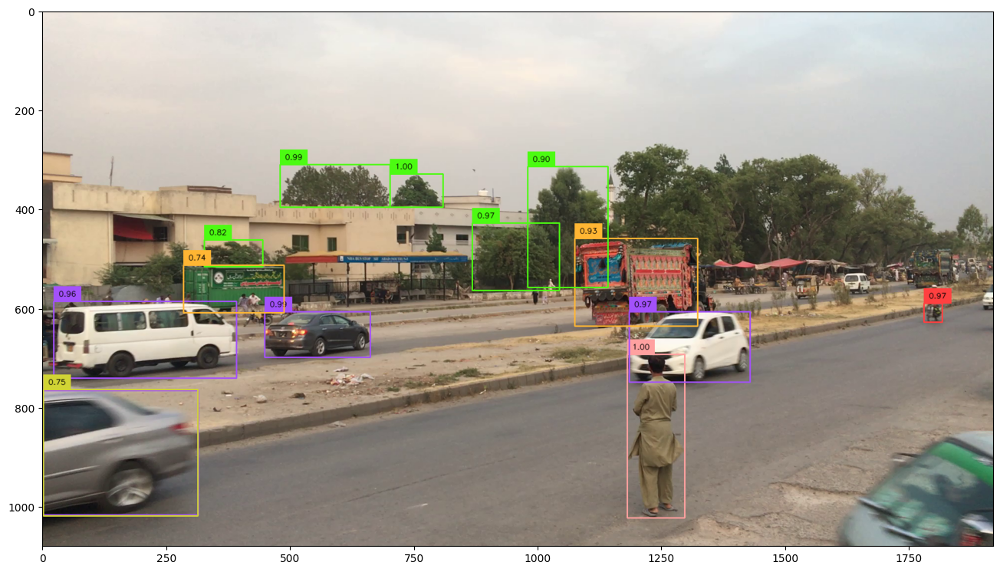

In [38]:
import supervision
from supervision.draw.color import ColorPalette
from supervision.geometry.dataclasses import Point
from supervision.video.dataclasses import VideoInfo
from supervision.video.source import get_video_frames_generator
from supervision.video.sink import VideoSink
from supervision.notebook.utils import show_frame_in_notebook
from supervision.tools.detections import Detections, BoxAnnotator
from supervision.tools.line_counter import LineCounter, LineCounterAnnotator
import torch  # Assuming you're using a PyTorch-based model
import matplotlib.pyplot as plt

# Assuming you have a defined model and SOURCE_VIDEO_PATH
# model = ... (Your object detection model here)
# SOURCE_VIDEO_PATH = 'path_to_your_video.mp4'

# Define a basic color palette using a color generator from the supervision library
color_palette = ColorPalette.default()  # Using the default method to generate colors

# Initialize the video frame generator
generator = get_video_frames_generator(SOURCE_VIDEO_PATH)

# Create an instance of BoxAnnotator with the basic color palette
box_annotator = BoxAnnotator(color=color_palette, thickness=2, text_thickness=0, text_scale=0.5)

# Acquire the first video frame
iterator = iter(generator)
frame = next(iterator)

# Model prediction on a single frame and conversion to supervision Detections
results = model(frame, conf=0.7)  # Ensure 'model' is properly defined
detections = Detections(
    xyxy=results[0].boxes.xyxy.cpu().numpy(),
    confidence=results[0].boxes.conf.cpu().numpy(),
    class_id=results[0].boxes.cls.cpu().numpy().astype(int)
)

# Format custom labels
labels = [
    f"{confidence:0.2f}"  # Example: just showing confidence
    for _, confidence, class_id
    in zip(detections.xyxy, detections.confidence, detections.class_id)
]

# Annotate and display frame
frame = box_annotator.annotate(frame=frame, detections=detections, labels=labels)

# Display the frame in a Jupyter notebook
%matplotlib inline
show_frame_in_notebook(frame, (16, 16))



0: 384x640 4 cars, 1 moter bike, 1 man, 2 trucks, 1 van, 5 trees, 8.3ms
Speed: 3.3ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


default is deprecated: `ColorPalette.default()` is deprecated and will be removed in `supervision-0.22.0`. Use `Color.DEFAULT` instead.


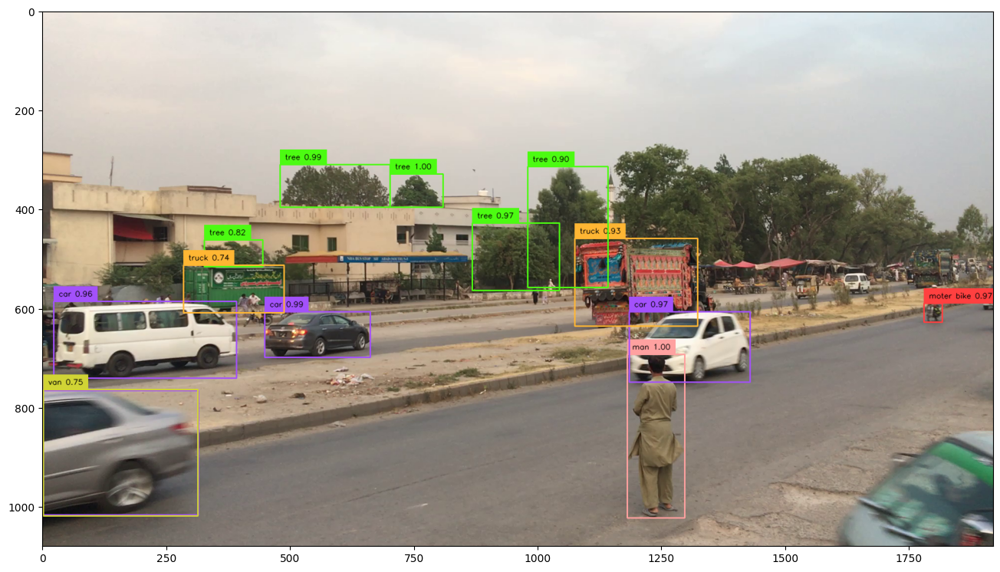

In [39]:
generator = get_video_frames_generator(SOURCE_VIDEO_PATH)

# create instance of BoxAnnotator
color_palette = ColorPalette.default()
box_annotator = BoxAnnotator(color=color_palette, thickness=2, text_thickness=0, text_scale=0.5)

# acquire first video frame
iterator = iter(generator)
frame = next(iterator)

# model prediction on single frame and conversion to supervision Detections
results = model(frame, conf=0.7)
detections = Detections(
    xyxy=results[0].boxes.xyxy.cpu().numpy(),
    confidence=results[0].boxes.conf.cpu().numpy(),
    class_id=results[0].boxes.cls.cpu().numpy().astype(int)
)

# Define the CLASS_NAMES_DICT
CLASS_NAMES_DICT = {0: "car", 1: "moter bike", 2: "man", 3: "rickshaw", 4: "truck", 5: "van", 6: "tree"}

# format custom labels
labels = [
    f"{CLASS_NAMES_DICT[class_id]} {confidence:0.2f}"
    for class_id, confidence in zip(detections.class_id, detections.confidence)
]

# annotate and display frame
frame = box_annotator.annotate(frame=frame, detections=detections, labels=labels)

%matplotlib inline
show_frame_in_notebook(frame, (16, 16))


In [ ]:
# import numpy as np
# import supervision as sv
# from ultralytics import YOLO

# # Assuming 'model' is already defined and loaded
# # model = YOLO('path/to/your/model.pt')

# def process_frame(frame: np.ndarray, _) -> np.ndarray:
#     results = model(frame, imgsz=1280)[0]

#     # Convert results to Supervision Detections
#     detections = sv.Detections.from_ultralytics(results)

#     # Debugging: Print the structure of a detection
#     print("Detections:", detections)

#     # Create an annotator
#     box_annotator = sv.BoxAnnotator(thickness=4, text_thickness=4, text_scale=2)

#     # Create labels
#     labels = []
#     for detection in detections:
#         # Debugging: Print the structure of each detection
#         print("Detection:", detection)
        
#         # Adjust the unpacking according to the actual structure
#         bbox, _, confidence, class_id, _, _ = detection
        
#         x1, y1, x2, y2 = bbox
#         label = f"{model.names[int(class_id)]} {confidence:0.2f}"
#         labels.append(label)

#     # Annotate frame
#     frame = box_annotator.annotate(scene=frame, detections=detections, labels=labels)

#     return frame

# # Process the video
# sv.process_video(source_path=video_path, target_path=f"{home}/result.webm", callback=process_frame)


### Inference of video 

In [44]:
import cv2
#from yolov5 import YOLO  # Assuming you have a YOLO class that wraps around the model
import supervision as sv  # Assuming you are using the supervision library
from supervision.tools.detections import Detections
#from supervision.tools.color import ColorPalette
#from supervision.tools.box_annotator import BoxAnnotator

# Load the YOLO model
MODEL = f"{home}/runs/detect/train/weights/best.pt"
model = YOLO(MODEL)
model.fuse()

# Video source path
SOURCE_VIDEO_PATH = '/kaggle/input/trafic-video/IMG_6706.MOV'

# Create video capture object
cap = cv2.VideoCapture(SOURCE_VIDEO_PATH)

# Create video writer object to save the output
output_path = '/kaggle/working/annotated_video.mov'
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
fps = cap.get(cv2.CAP_PROP_FPS)
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
out = cv2.VideoWriter(output_path, fourcc, fps, (width, height))

# Create instance of BoxAnnotator
color_palette = ColorPalette.default()
box_annotator = BoxAnnotator(color=color_palette, thickness=2, text_thickness=0, text_scale=0.5)

# Define the CLASS_NAMES_DICT
CLASS_NAMES_DICT = {0: "car", 1: "moter bike", 2: "man", 3: "rickshaw", 4: "truck", 5: "van", 6: "tree"}

# Process video frame by frame
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break
    
    # Model prediction on the frame and conversion to supervision Detections
    results = model(frame, conf=0.7)
    detections = Detections(
        xyxy=results[0].boxes.xyxy.cpu().numpy(),
        confidence=results[0].boxes.conf.cpu().numpy(),
        class_id=results[0].boxes.cls.cpu().numpy().astype(int)
    )
    
    # Format custom labels
    labels = [
        f"{CLASS_NAMES_DICT[class_id]} {confidence:0.2f}"
        for class_id, confidence in zip(detections.class_id, detections.confidence)
    ]
    
    # Annotate the frame
    frame = box_annotator.annotate(frame=frame, detections=detections, labels=labels)
    
    # Write the annotated frame to the output video
    out.write(frame)

# Release resources
cap.release()
out.release()
cv2.destroyAllWindows()


Model summary (fused): 168 layers, 11128293 parameters, 0 gradients, 28.5 GFLOPs

0: 384x640 4 cars, 1 moter bike, 1 man, 2 trucks, 1 van, 5 trees, 14.3ms
Speed: 3.4ms preprocess, 14.3ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 cars, 1 moter bike, 1 man, 2 trucks, 7 trees, 8.5ms
Speed: 2.6ms preprocess, 8.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



default is deprecated: `ColorPalette.default()` is deprecated and will be removed in `supervision-0.22.0`. Use `Color.DEFAULT` instead.


0: 384x640 6 cars, 1 moter bike, 1 man, 3 trucks, 1 van, 5 trees, 9.0ms
Speed: 2.6ms preprocess, 9.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 cars, 1 moter bike, 1 man, 2 trucks, 1 van, 6 trees, 8.6ms
Speed: 2.6ms preprocess, 8.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 cars, 2 moter bikes, 1 man, 2 trucks, 7 trees, 8.8ms
Speed: 2.5ms preprocess, 8.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 cars, 2 moter bikes, 1 man, 1 truck, 1 van, 5 trees, 8.5ms
Speed: 2.5ms preprocess, 8.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 cars, 2 moter bikes, 1 man, 2 trucks, 4 trees, 12.4ms
Speed: 3.9ms preprocess, 12.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 cars, 2 moter bikes, 1 man, 1 truck, 5 trees, 11.7ms
Speed: 3.9ms preprocess, 11.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0

error: OpenCV(4.9.0) /io/opencv/modules/highgui/src/window.cpp:1266: error: (-2:Unspecified error) The function is not implemented. Rebuild the library with Windows, GTK+ 2.x or Cocoa support. If you are on Ubuntu or Debian, install libgtk2.0-dev and pkg-config, then re-run cmake or configure script in function 'cvDestroyAllWindows'
